<a href="https://colab.research.google.com/github/shotahorii/baredl/blob/master/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install bareml

     |████████████████████████████████| 81kB 3.4MB/s 


In [2]:
from bareml.deeplearning import cuda
from bareml.deeplearning import layers as nn
from bareml.deeplearning import functions as F
from bareml.deeplearning.optimisers import Adam
from bareml.deeplearning.data import MNIST, DataLoader
from bareml.deeplearning.config import no_grad, test_mode
from bareml.deeplearning.core import as_tensor, as_numpy
from bareml.deeplearning.transforms import Compose, Normalise, ToTensor, Flatten

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [11]:
# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 28

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Number of training epochs
num_epochs = 50

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# 'cuda' if gpu enabled, else 'cpu'
device = 'cuda'

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = as_tensor(np.random.randn(25, nz)).to(device)

In [12]:
transform = Compose([Flatten(), Normalise(127.5, 127.5), ToTensor()])
dataset = MNIST(train=True, transform=transform) 
dataloader = DataLoader(dataset, batch_size)

In [13]:
class Generator(nn.Module):
    def __init__(self, nz, image_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(in_features=nz, out_features=256),
            nn.BatchNorm2d(momentum=0.1),
            nn.LeakyReLU(),
            nn.Linear(in_features=256, out_features=512),
            nn.BatchNorm2d(momentum=0.1),
            nn.LeakyReLU(),
            nn.Linear(in_features=512, out_features=1024),
            nn.BatchNorm2d(momentum=0.1),
            nn.LeakyReLU(),
            nn.Linear(in_features=1024, out_features=image_size*image_size),
            nn.Tanh()
        )

    def forward(self, input):
      return self.main(input)

In [14]:
netG = Generator(nz=nz, image_size=image_size).to(device)

In [15]:
class Discriminator(nn.Module):
    def __init__(self, image_size):
        super().__init__()
        self.main = nn.Sequential(
            nn.Linear(in_features=image_size*image_size, out_features=1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(in_features=1024, out_features=512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(in_features=512, out_features=256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(in_features=256, out_features=1),
            nn.Sigmoid(),
        )

    def forward(self, input):
        return self.main(input)

In [16]:
netD = Discriminator(image_size).to(device)

In [17]:
# Initialize BCELoss function
criterion = F.binary_cross_entropy

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = Adam(netD.parameters(), alpha=lr, beta1=beta1, beta2=0.999)
optimizerG = Adam(netG.parameters(), alpha=lr, beta1=beta1, beta2=0.999)

Starting Training Loop...
[0/50][0/468]	Loss_D: 1.3802	Loss_G: 0.7849	D(x): 0.4926	D(G(z)): 0.4694 / 0.4576


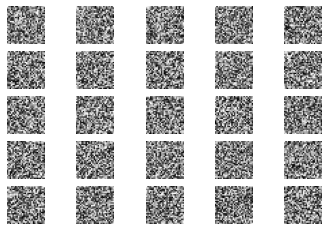

[0/50][120/468]	Loss_D: 1.1802	Loss_G: 0.9001	D(x): 0.5848	D(G(z)): 0.4524 / 0.4085


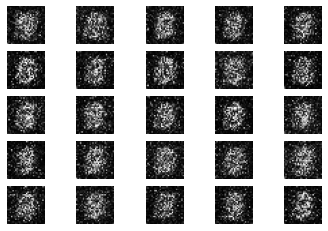

[0/50][240/468]	Loss_D: 1.2356	Loss_G: 0.7787	D(x): 0.5074	D(G(z)): 0.3635 / 0.4655


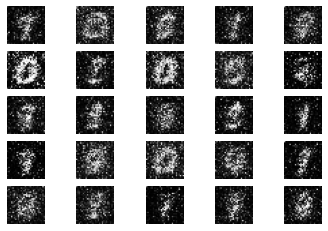

[0/50][360/468]	Loss_D: 1.3537	Loss_G: 0.5898	D(x): 0.5223	D(G(z)): 0.4785 / 0.5575


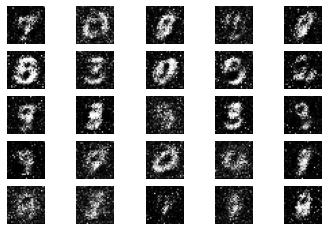

[1/50][0/468]	Loss_D: 1.1943	Loss_G: 0.7768	D(x): 0.6010	D(G(z)): 0.4710 / 0.4657


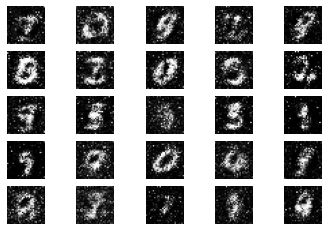

[1/50][120/468]	Loss_D: 1.1692	Loss_G: 0.8707	D(x): 0.5997	D(G(z)): 0.4570 / 0.4250


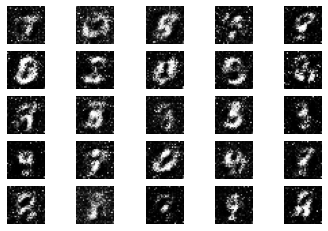

[1/50][240/468]	Loss_D: 1.1943	Loss_G: 0.6684	D(x): 0.5232	D(G(z)): 0.3757 / 0.5185


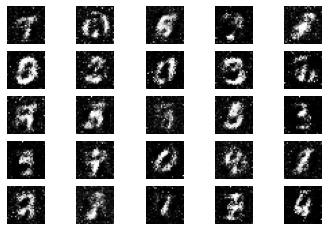

[1/50][360/468]	Loss_D: 1.1935	Loss_G: 0.6931	D(x): 0.5526	D(G(z)): 0.4171 / 0.5055


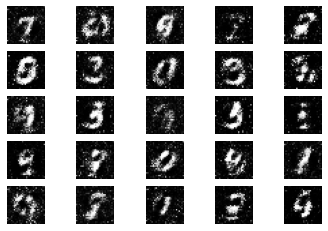

[2/50][0/468]	Loss_D: 1.4757	Loss_G: 0.4739	D(x): 0.3381	D(G(z)): 0.2295 / 0.6277


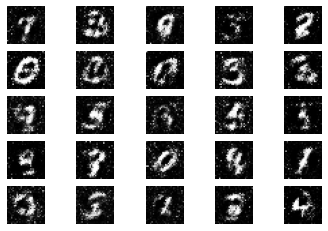

[2/50][120/468]	Loss_D: 1.1076	Loss_G: 1.0306	D(x): 0.5869	D(G(z)): 0.4043 / 0.3649


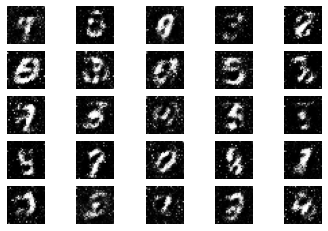

[2/50][240/468]	Loss_D: 1.1197	Loss_G: 1.0976	D(x): 0.6200	D(G(z)): 0.4274 / 0.3440


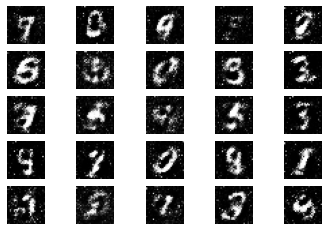

[2/50][360/468]	Loss_D: 1.1524	Loss_G: 0.8070	D(x): 0.5619	D(G(z)): 0.3828 / 0.4586


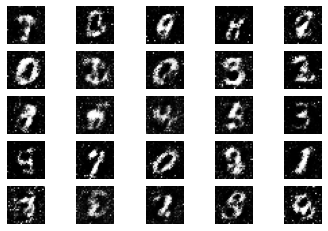

[3/50][0/468]	Loss_D: 1.1490	Loss_G: 0.6946	D(x): 0.5310	D(G(z)): 0.3292 / 0.5099


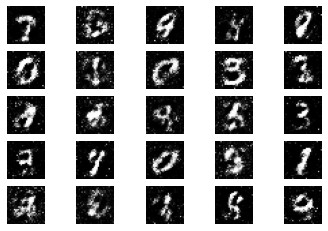

[3/50][120/468]	Loss_D: 1.1635	Loss_G: 1.2510	D(x): 0.6768	D(G(z)): 0.4971 / 0.2963


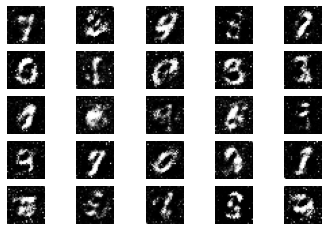

[3/50][240/468]	Loss_D: 1.1267	Loss_G: 0.9736	D(x): 0.6155	D(G(z)): 0.4179 / 0.3917


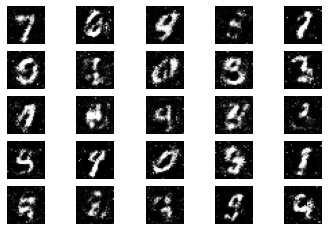

[3/50][360/468]	Loss_D: 1.1277	Loss_G: 1.1726	D(x): 0.6291	D(G(z)): 0.4253 / 0.3244


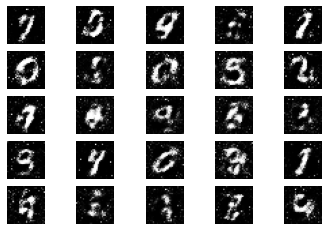

[4/50][0/468]	Loss_D: 1.1821	Loss_G: 1.1264	D(x): 0.6635	D(G(z)): 0.4881 / 0.3390


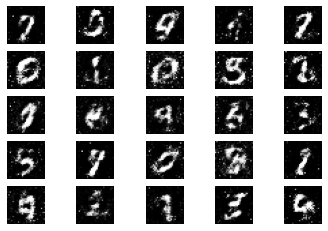

[4/50][120/468]	Loss_D: 1.2673	Loss_G: 0.5889	D(x): 0.4430	D(G(z)): 0.2749 / 0.5672


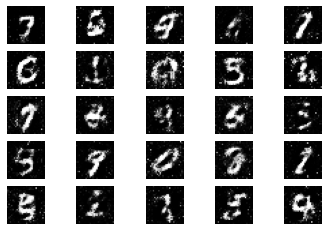

[4/50][240/468]	Loss_D: 1.1439	Loss_G: 0.9900	D(x): 0.6166	D(G(z)): 0.4285 / 0.3819


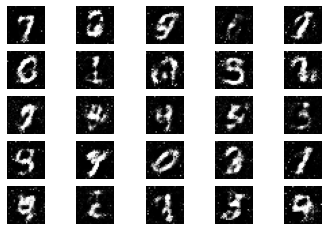

[4/50][360/468]	Loss_D: 1.1268	Loss_G: 1.0531	D(x): 0.6562	D(G(z)): 0.4571 / 0.3619


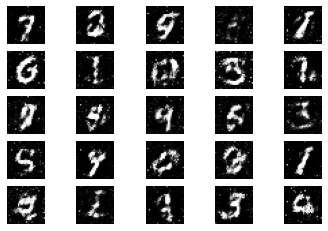

[5/50][0/468]	Loss_D: 1.1625	Loss_G: 0.9872	D(x): 0.6000	D(G(z)): 0.4316 / 0.3846


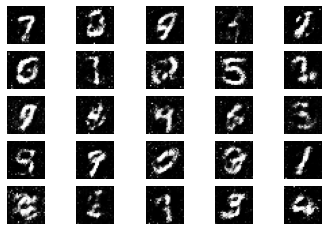

[5/50][120/468]	Loss_D: 1.1503	Loss_G: 0.8640	D(x): 0.5317	D(G(z)): 0.3483 / 0.4362


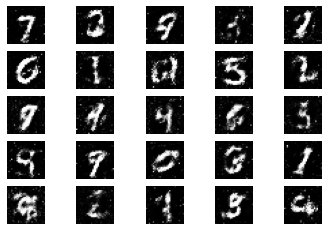

[5/50][240/468]	Loss_D: 1.2055	Loss_G: 1.1728	D(x): 0.6751	D(G(z)): 0.5039 / 0.3223


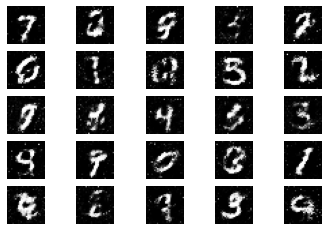

[5/50][360/468]	Loss_D: 1.2891	Loss_G: 1.2318	D(x): 0.6654	D(G(z)): 0.5345 / 0.3032


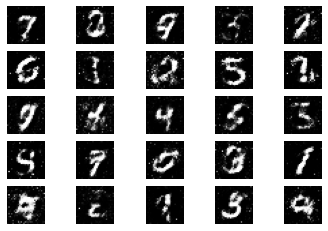

[6/50][0/468]	Loss_D: 1.1790	Loss_G: 1.0225	D(x): 0.5849	D(G(z)): 0.4259 / 0.3715


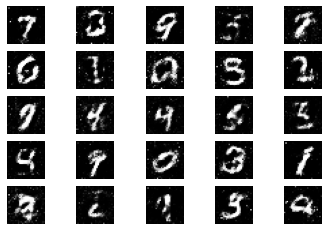

[6/50][120/468]	Loss_D: 1.1630	Loss_G: 0.8578	D(x): 0.5222	D(G(z)): 0.3347 / 0.4352


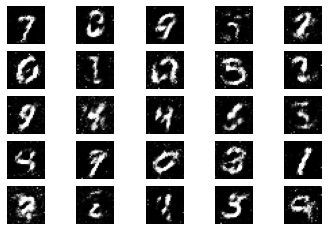

[6/50][240/468]	Loss_D: 1.1921	Loss_G: 1.0526	D(x): 0.5796	D(G(z)): 0.4198 / 0.3632


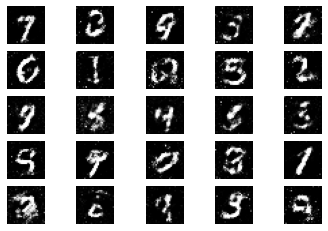

[6/50][360/468]	Loss_D: 1.1988	Loss_G: 0.9191	D(x): 0.5547	D(G(z)): 0.3994 / 0.4142


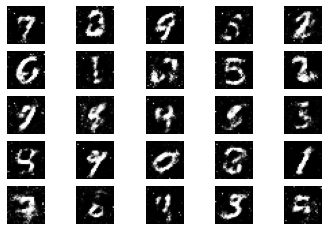

[7/50][0/468]	Loss_D: 1.2114	Loss_G: 0.8711	D(x): 0.5260	D(G(z)): 0.3686 / 0.4320


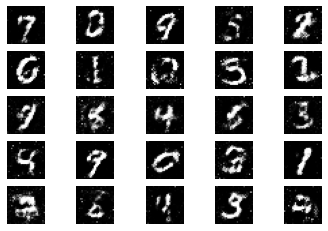

[7/50][120/468]	Loss_D: 1.2431	Loss_G: 1.0143	D(x): 0.5602	D(G(z)): 0.4343 / 0.3718


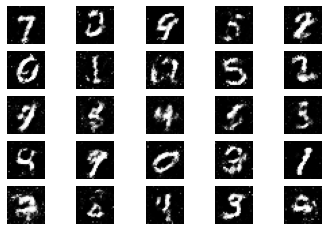

[7/50][240/468]	Loss_D: 1.1776	Loss_G: 0.9977	D(x): 0.5812	D(G(z)): 0.4199 / 0.3823


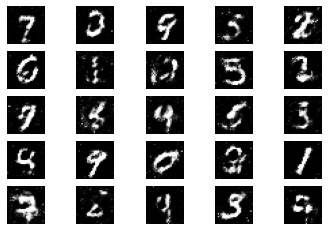

[7/50][360/468]	Loss_D: 1.2761	Loss_G: 0.8486	D(x): 0.5074	D(G(z)): 0.3949 / 0.4415


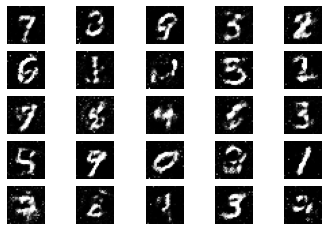

[8/50][0/468]	Loss_D: 1.1463	Loss_G: 0.9009	D(x): 0.5944	D(G(z)): 0.4183 / 0.4151


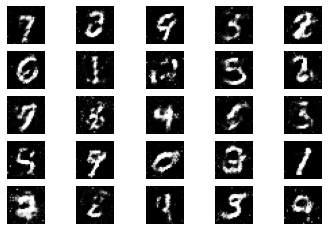

[8/50][120/468]	Loss_D: 1.1989	Loss_G: 1.0199	D(x): 0.5727	D(G(z)): 0.4350 / 0.3723


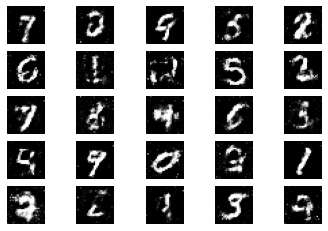

[8/50][240/468]	Loss_D: 1.3683	Loss_G: 0.8280	D(x): 0.4623	D(G(z)): 0.3670 / 0.4486


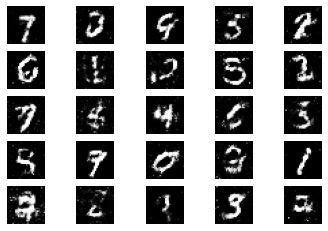

[8/50][360/468]	Loss_D: 1.1791	Loss_G: 1.0083	D(x): 0.6010	D(G(z)): 0.4355 / 0.3755


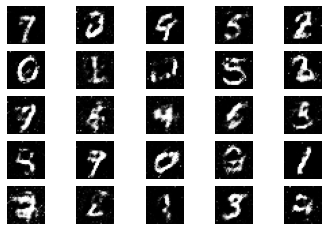

[9/50][0/468]	Loss_D: 1.2562	Loss_G: 0.8733	D(x): 0.5548	D(G(z)): 0.4358 / 0.4265


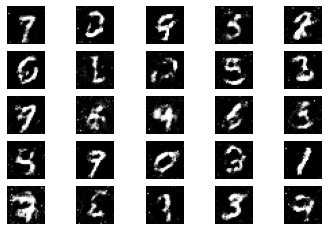

[9/50][120/468]	Loss_D: 1.2222	Loss_G: 0.9869	D(x): 0.5103	D(G(z)): 0.3603 / 0.3845


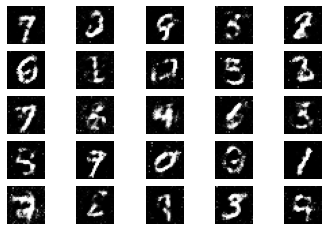

[9/50][240/468]	Loss_D: 1.2662	Loss_G: 1.0247	D(x): 0.5586	D(G(z)): 0.4413 / 0.3716


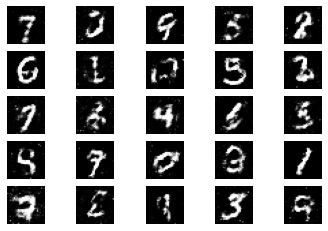

[9/50][360/468]	Loss_D: 1.2467	Loss_G: 1.0310	D(x): 0.5991	D(G(z)): 0.4711 / 0.3672


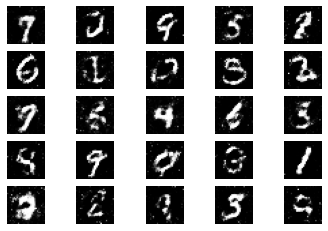

[10/50][0/468]	Loss_D: 1.2647	Loss_G: 0.9289	D(x): 0.5276	D(G(z)): 0.4136 / 0.4063


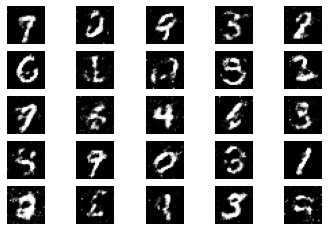

[10/50][120/468]	Loss_D: 1.1831	Loss_G: 0.8916	D(x): 0.5631	D(G(z)): 0.3980 / 0.4222


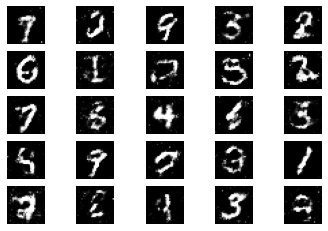

[10/50][240/468]	Loss_D: 1.2914	Loss_G: 1.0539	D(x): 0.5633	D(G(z)): 0.4558 / 0.3578


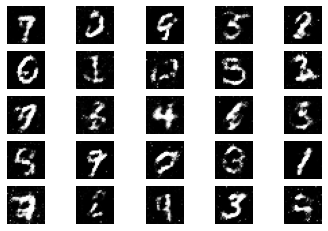

[10/50][360/468]	Loss_D: 1.2879	Loss_G: 0.9986	D(x): 0.5620	D(G(z)): 0.4647 / 0.3797


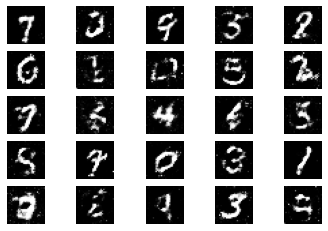

[11/50][0/468]	Loss_D: 1.2232	Loss_G: 1.0098	D(x): 0.5533	D(G(z)): 0.4233 / 0.3736


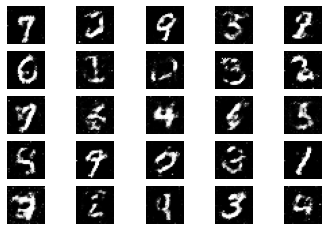

[11/50][120/468]	Loss_D: 1.2533	Loss_G: 0.9108	D(x): 0.5265	D(G(z)): 0.4153 / 0.4101


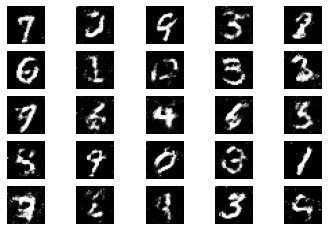

[11/50][240/468]	Loss_D: 1.2881	Loss_G: 1.0239	D(x): 0.6032	D(G(z)): 0.5002 / 0.3691


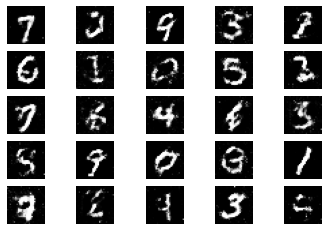

[11/50][360/468]	Loss_D: 1.2478	Loss_G: 0.9688	D(x): 0.5937	D(G(z)): 0.4688 / 0.3881


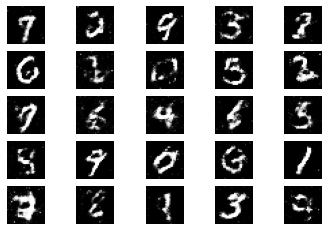

[12/50][0/468]	Loss_D: 1.2495	Loss_G: 0.9016	D(x): 0.5942	D(G(z)): 0.4856 / 0.4149


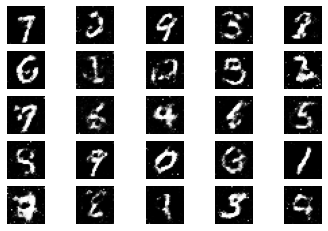

[12/50][120/468]	Loss_D: 1.3552	Loss_G: 0.9468	D(x): 0.5341	D(G(z)): 0.4579 / 0.3976


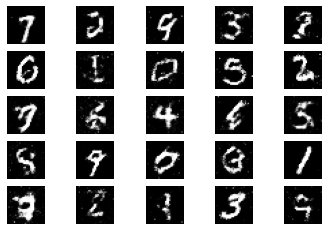

[12/50][240/468]	Loss_D: 1.2035	Loss_G: 1.0904	D(x): 0.6068	D(G(z)): 0.4603 / 0.3464


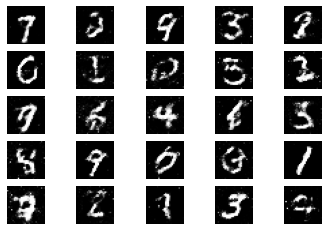

[12/50][360/468]	Loss_D: 1.2994	Loss_G: 1.0564	D(x): 0.5905	D(G(z)): 0.4981 / 0.3555


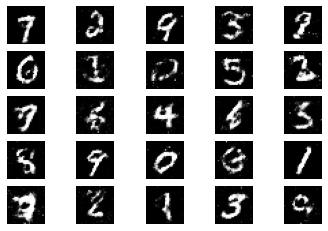

[13/50][0/468]	Loss_D: 1.3480	Loss_G: 0.9296	D(x): 0.5207	D(G(z)): 0.4604 / 0.4050


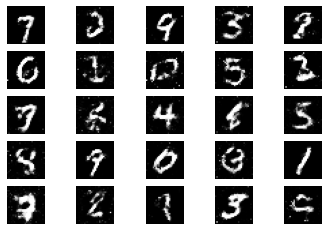

[13/50][120/468]	Loss_D: 1.3138	Loss_G: 0.9823	D(x): 0.5212	D(G(z)): 0.4300 / 0.3850


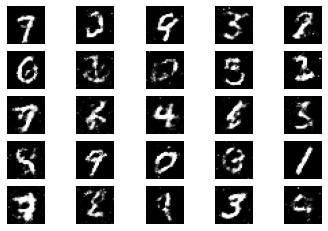

[13/50][240/468]	Loss_D: 1.2723	Loss_G: 0.8484	D(x): 0.5308	D(G(z)): 0.4292 / 0.4382


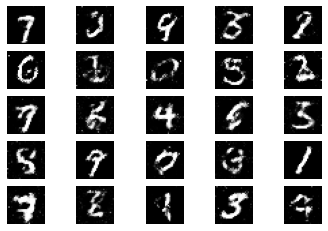

[13/50][360/468]	Loss_D: 1.3029	Loss_G: 0.8321	D(x): 0.4969	D(G(z)): 0.4061 / 0.4455


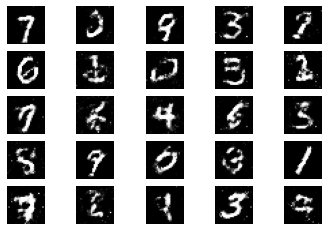

[14/50][0/468]	Loss_D: 1.3238	Loss_G: 0.8484	D(x): 0.5235	D(G(z)): 0.4486 / 0.4343


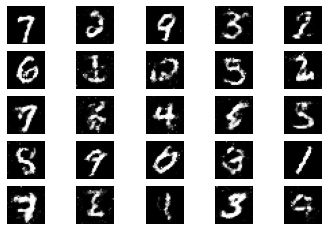

[14/50][120/468]	Loss_D: 1.2384	Loss_G: 0.9896	D(x): 0.5693	D(G(z)): 0.4483 / 0.3813


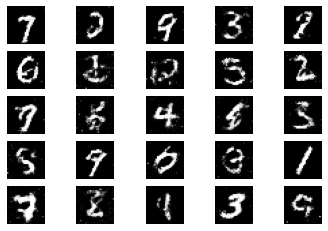

[14/50][240/468]	Loss_D: 1.2893	Loss_G: 0.8576	D(x): 0.5529	D(G(z)): 0.4682 / 0.4303


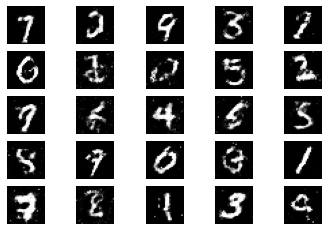

[14/50][360/468]	Loss_D: 1.2430	Loss_G: 0.8912	D(x): 0.5659	D(G(z)): 0.4523 / 0.4195


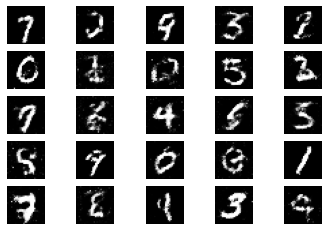

[15/50][0/468]	Loss_D: 1.3332	Loss_G: 0.8147	D(x): 0.4848	D(G(z)): 0.4185 / 0.4515


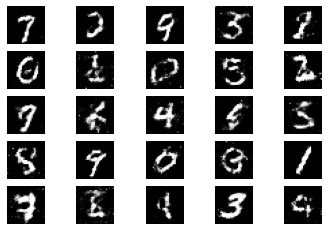

[15/50][120/468]	Loss_D: 1.2586	Loss_G: 0.9944	D(x): 0.5812	D(G(z)): 0.4706 / 0.3793


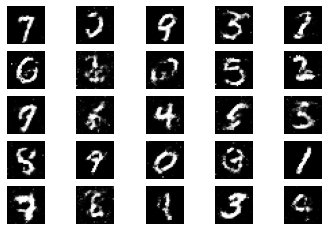

[15/50][240/468]	Loss_D: 1.2867	Loss_G: 1.0129	D(x): 0.5739	D(G(z)): 0.4868 / 0.3705


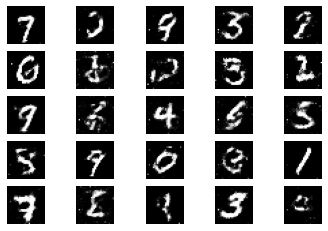

[15/50][360/468]	Loss_D: 1.3264	Loss_G: 0.9558	D(x): 0.5346	D(G(z)): 0.4564 / 0.3949


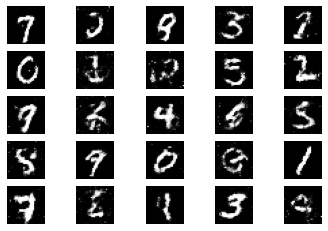

[16/50][0/468]	Loss_D: 1.3127	Loss_G: 1.0474	D(x): 0.5488	D(G(z)): 0.4646 / 0.3613


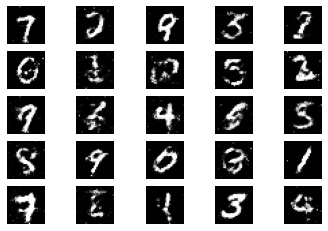

[16/50][120/468]	Loss_D: 1.2455	Loss_G: 0.9107	D(x): 0.5634	D(G(z)): 0.4554 / 0.4117


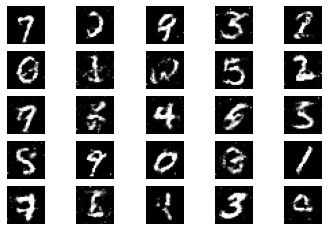

[16/50][240/468]	Loss_D: 1.3209	Loss_G: 0.8745	D(x): 0.5416	D(G(z)): 0.4674 / 0.4228


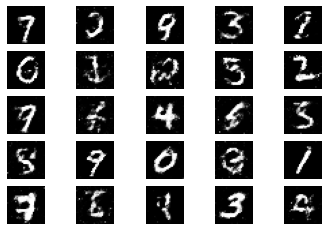

[16/50][360/468]	Loss_D: 1.2732	Loss_G: 0.8926	D(x): 0.5167	D(G(z)): 0.4269 / 0.4163


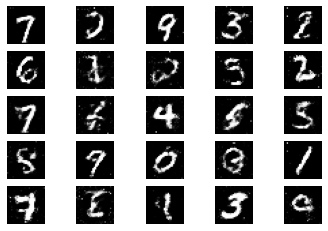

[17/50][0/468]	Loss_D: 1.2729	Loss_G: 1.0371	D(x): 0.6141	D(G(z)): 0.5097 / 0.3618


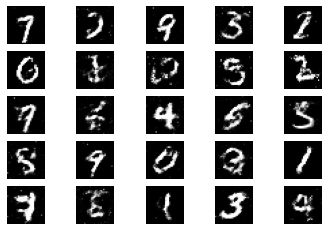

[17/50][120/468]	Loss_D: 1.2779	Loss_G: 0.9143	D(x): 0.5794	D(G(z)): 0.4904 / 0.4065


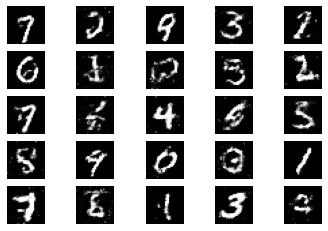

[17/50][240/468]	Loss_D: 1.3331	Loss_G: 0.8439	D(x): 0.5094	D(G(z)): 0.4435 / 0.4380


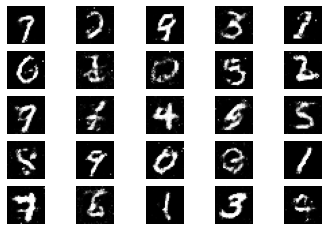

[17/50][360/468]	Loss_D: 1.2849	Loss_G: 0.9184	D(x): 0.5627	D(G(z)): 0.4778 / 0.4060


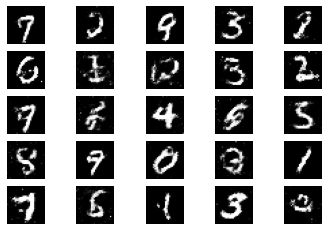

[18/50][0/468]	Loss_D: 1.2849	Loss_G: 0.9260	D(x): 0.5499	D(G(z)): 0.4668 / 0.4033


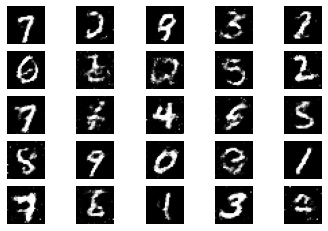

[18/50][120/468]	Loss_D: 1.3007	Loss_G: 0.9446	D(x): 0.5268	D(G(z)): 0.4460 / 0.3947


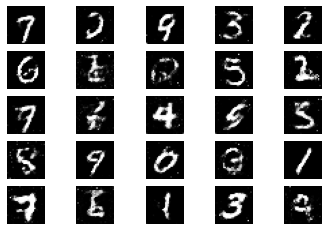

[18/50][240/468]	Loss_D: 1.3045	Loss_G: 0.9657	D(x): 0.5345	D(G(z)): 0.4572 / 0.3891


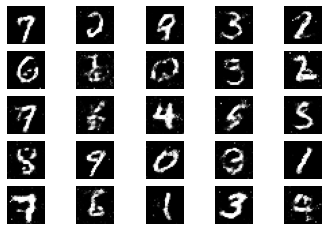

[18/50][360/468]	Loss_D: 1.3309	Loss_G: 0.9135	D(x): 0.5348	D(G(z)): 0.4756 / 0.4074


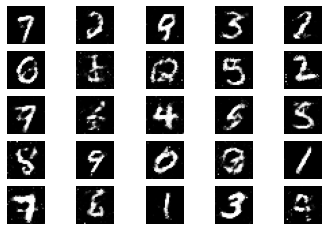

[19/50][0/468]	Loss_D: 1.2999	Loss_G: 0.8644	D(x): 0.5456	D(G(z)): 0.4688 / 0.4294


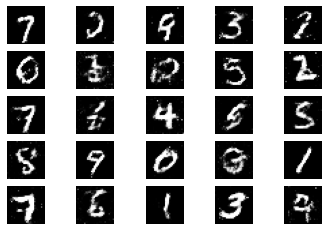

[19/50][120/468]	Loss_D: 1.3417	Loss_G: 0.9668	D(x): 0.5318	D(G(z)): 0.4679 / 0.3873


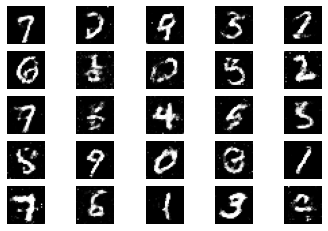

[19/50][240/468]	Loss_D: 1.2962	Loss_G: 0.9415	D(x): 0.5473	D(G(z)): 0.4674 / 0.3972


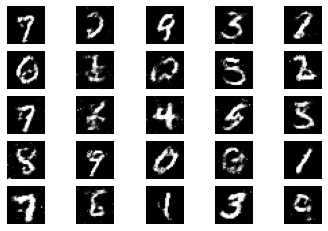

[19/50][360/468]	Loss_D: 1.2631	Loss_G: 0.9065	D(x): 0.5512	D(G(z)): 0.4551 / 0.4111


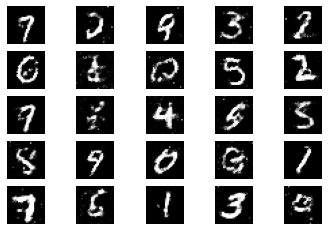

[20/50][0/468]	Loss_D: 1.3330	Loss_G: 1.0266	D(x): 0.5490	D(G(z)): 0.4850 / 0.3670


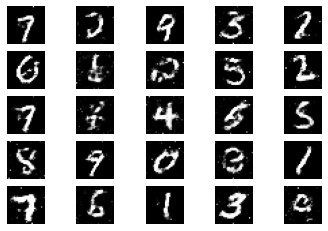

[20/50][120/468]	Loss_D: 1.3289	Loss_G: 0.9524	D(x): 0.5611	D(G(z)): 0.4967 / 0.3904


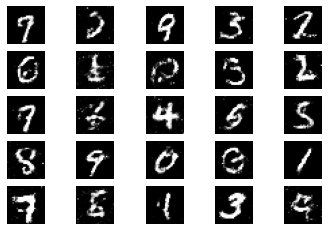

[20/50][240/468]	Loss_D: 1.3802	Loss_G: 0.9357	D(x): 0.5325	D(G(z)): 0.4877 / 0.3982


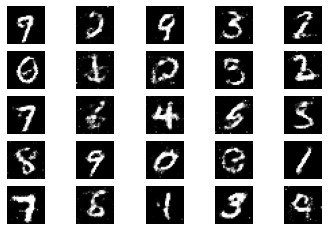

[20/50][360/468]	Loss_D: 1.3357	Loss_G: 0.9014	D(x): 0.5403	D(G(z)): 0.4715 / 0.4163


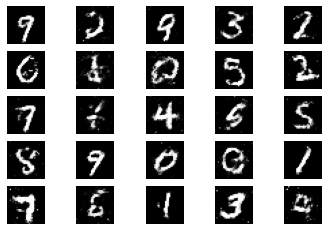

[21/50][0/468]	Loss_D: 1.3251	Loss_G: 0.9267	D(x): 0.5338	D(G(z)): 0.4656 / 0.4008


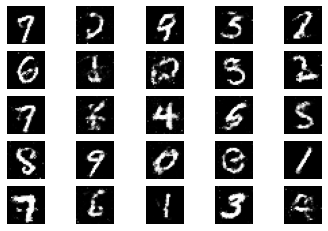

[21/50][120/468]	Loss_D: 1.3230	Loss_G: 0.8305	D(x): 0.5147	D(G(z)): 0.4518 / 0.4423


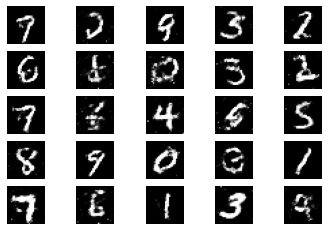

[21/50][240/468]	Loss_D: 1.3138	Loss_G: 0.9359	D(x): 0.5408	D(G(z)): 0.4674 / 0.3992


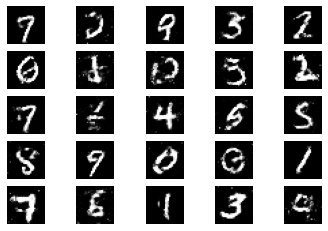

[21/50][360/468]	Loss_D: 1.2597	Loss_G: 0.8857	D(x): 0.5169	D(G(z)): 0.4159 / 0.4205


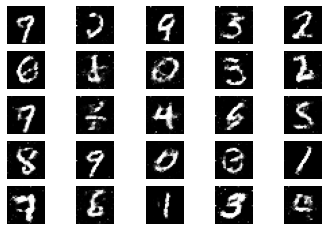

[22/50][0/468]	Loss_D: 1.3055	Loss_G: 0.9329	D(x): 0.5632	D(G(z)): 0.4832 / 0.3997


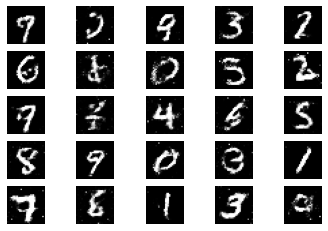

[22/50][120/468]	Loss_D: 1.2731	Loss_G: 0.9343	D(x): 0.5251	D(G(z)): 0.4328 / 0.4008


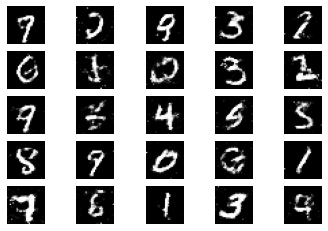

[22/50][240/468]	Loss_D: 1.3086	Loss_G: 1.0011	D(x): 0.5639	D(G(z)): 0.4933 / 0.3725


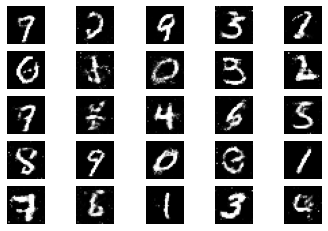

[22/50][360/468]	Loss_D: 1.3160	Loss_G: 0.9275	D(x): 0.5199	D(G(z)): 0.4557 / 0.4022


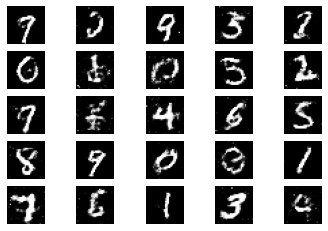

[23/50][0/468]	Loss_D: 1.2774	Loss_G: 0.9103	D(x): 0.5690	D(G(z)): 0.4814 / 0.4090


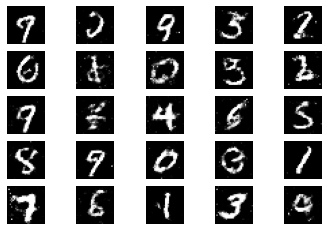

[23/50][120/468]	Loss_D: 1.3417	Loss_G: 0.8723	D(x): 0.4961	D(G(z)): 0.4371 / 0.4242


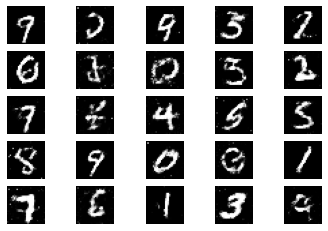

[23/50][240/468]	Loss_D: 1.2848	Loss_G: 0.9807	D(x): 0.5282	D(G(z)): 0.4436 / 0.3850


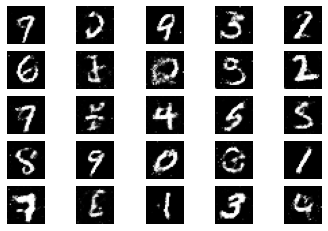

[23/50][360/468]	Loss_D: 1.3418	Loss_G: 0.8919	D(x): 0.5322	D(G(z)): 0.4845 / 0.4149


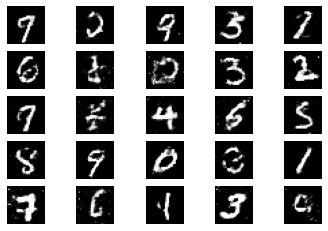

[24/50][0/468]	Loss_D: 1.3314	Loss_G: 0.9598	D(x): 0.5341	D(G(z)): 0.4719 / 0.3886


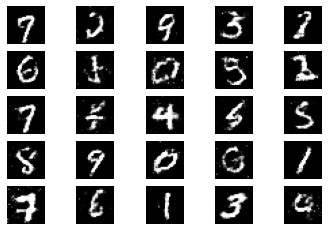

[24/50][120/468]	Loss_D: 1.3001	Loss_G: 1.0128	D(x): 0.5425	D(G(z)): 0.4575 / 0.3687


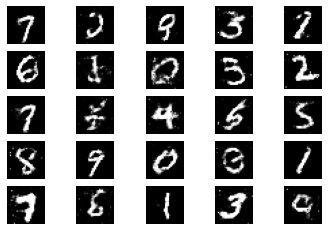

[24/50][240/468]	Loss_D: 1.2841	Loss_G: 0.8931	D(x): 0.5500	D(G(z)): 0.4685 / 0.4148


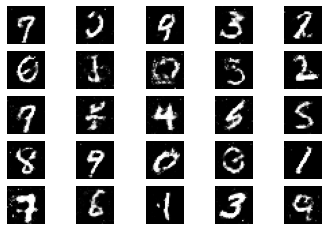

[24/50][360/468]	Loss_D: 1.3071	Loss_G: 0.8885	D(x): 0.5511	D(G(z)): 0.4792 / 0.4172


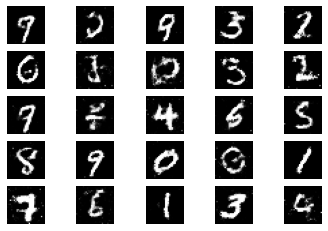

[25/50][0/468]	Loss_D: 1.3008	Loss_G: 0.9981	D(x): 0.5146	D(G(z)): 0.4366 / 0.3750


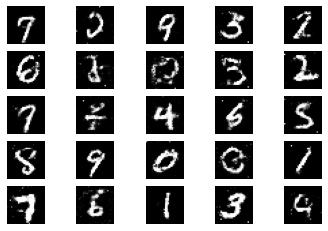

[25/50][120/468]	Loss_D: 1.3427	Loss_G: 0.8683	D(x): 0.4771	D(G(z)): 0.4241 / 0.4264


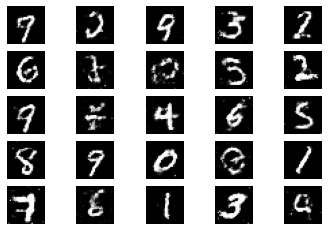

[25/50][240/468]	Loss_D: 1.2720	Loss_G: 0.9733	D(x): 0.5532	D(G(z)): 0.4608 / 0.3867


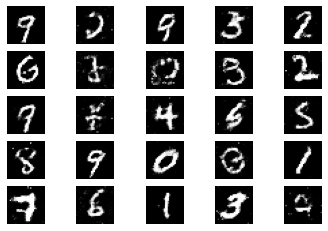

[25/50][360/468]	Loss_D: 1.3368	Loss_G: 0.9284	D(x): 0.5194	D(G(z)): 0.4546 / 0.4029


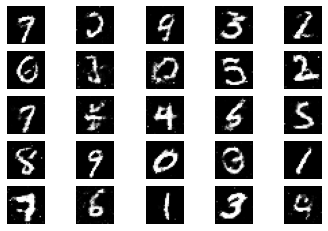

[26/50][0/468]	Loss_D: 1.2856	Loss_G: 0.8620	D(x): 0.5730	D(G(z)): 0.4907 / 0.4276


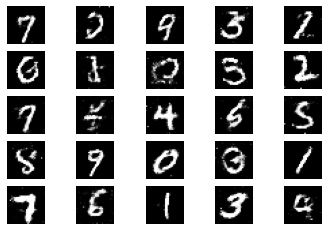

[26/50][120/468]	Loss_D: 1.3046	Loss_G: 0.8656	D(x): 0.5209	D(G(z)): 0.4476 / 0.4272


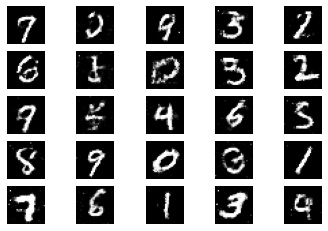

[26/50][240/468]	Loss_D: 1.3775	Loss_G: 0.8804	D(x): 0.5010	D(G(z)): 0.4586 / 0.4200


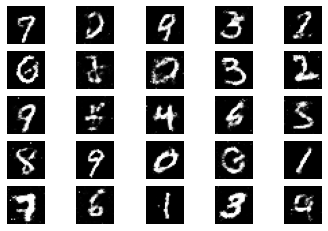

[26/50][360/468]	Loss_D: 1.3165	Loss_G: 0.8829	D(x): 0.5579	D(G(z)): 0.4958 / 0.4182


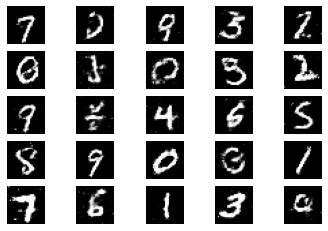

[27/50][0/468]	Loss_D: 1.2739	Loss_G: 0.8951	D(x): 0.5312	D(G(z)): 0.4425 / 0.4165


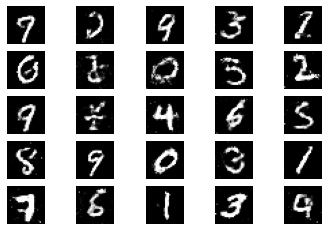

[27/50][120/468]	Loss_D: 1.2800	Loss_G: 0.9294	D(x): 0.5362	D(G(z)): 0.4489 / 0.4011


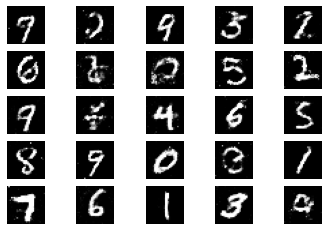

[27/50][240/468]	Loss_D: 1.3127	Loss_G: 0.8432	D(x): 0.5568	D(G(z)): 0.4898 / 0.4393


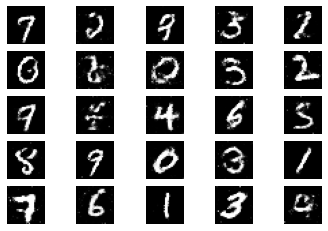

[27/50][360/468]	Loss_D: 1.2812	Loss_G: 0.9308	D(x): 0.5449	D(G(z)): 0.4589 / 0.4003


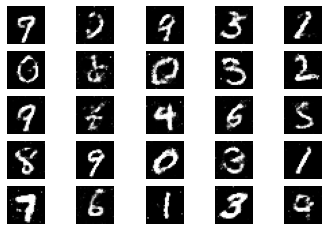

[28/50][0/468]	Loss_D: 1.3262	Loss_G: 0.8096	D(x): 0.5139	D(G(z)): 0.4585 / 0.4488


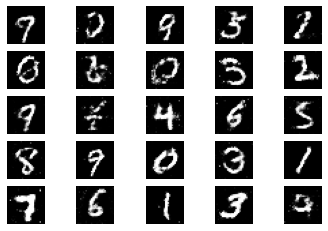

[28/50][120/468]	Loss_D: 1.3043	Loss_G: 0.9045	D(x): 0.5400	D(G(z)): 0.4722 / 0.4111


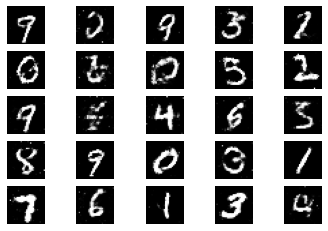

[28/50][240/468]	Loss_D: 1.3915	Loss_G: 0.8400	D(x): 0.5293	D(G(z)): 0.4978 / 0.4389


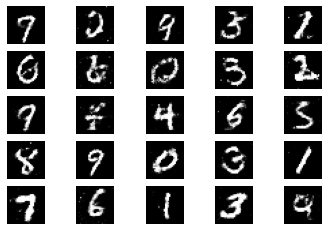

[28/50][360/468]	Loss_D: 1.3096	Loss_G: 0.8676	D(x): 0.5117	D(G(z)): 0.4485 / 0.4281


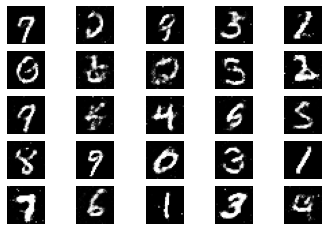

[29/50][0/468]	Loss_D: 1.3273	Loss_G: 0.8387	D(x): 0.4610	D(G(z)): 0.3920 / 0.4381


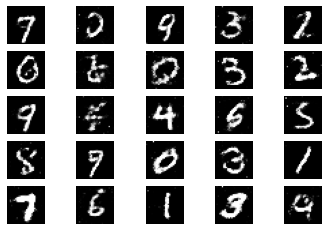

[29/50][120/468]	Loss_D: 1.3458	Loss_G: 0.9155	D(x): 0.5307	D(G(z)): 0.4804 / 0.4049


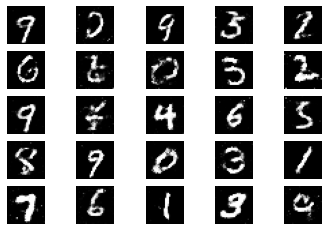

[29/50][240/468]	Loss_D: 1.3249	Loss_G: 0.8598	D(x): 0.5635	D(G(z)): 0.5054 / 0.4267


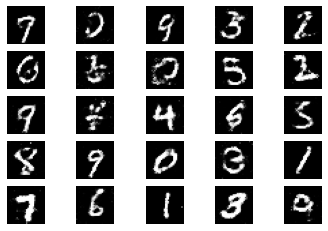

[29/50][360/468]	Loss_D: 1.2860	Loss_G: 0.9190	D(x): 0.4846	D(G(z)): 0.4039 / 0.4053


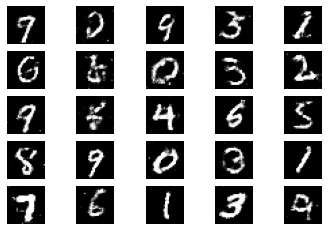

[30/50][0/468]	Loss_D: 1.3347	Loss_G: 0.9040	D(x): 0.5231	D(G(z)): 0.4636 / 0.4106


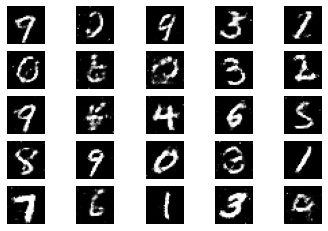

[30/50][120/468]	Loss_D: 1.2748	Loss_G: 0.9455	D(x): 0.5292	D(G(z)): 0.4443 / 0.3932


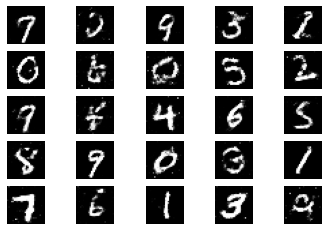

[30/50][240/468]	Loss_D: 1.3138	Loss_G: 0.8787	D(x): 0.5090	D(G(z)): 0.4460 / 0.4210


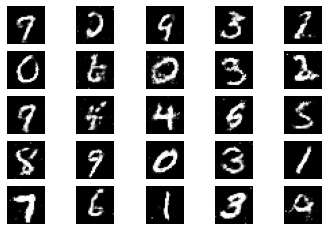

[30/50][360/468]	Loss_D: 1.3002	Loss_G: 0.8802	D(x): 0.5520	D(G(z)): 0.4838 / 0.4206


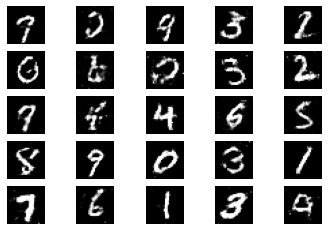

[31/50][0/468]	Loss_D: 1.2561	Loss_G: 0.9174	D(x): 0.5924	D(G(z)): 0.4897 / 0.4066


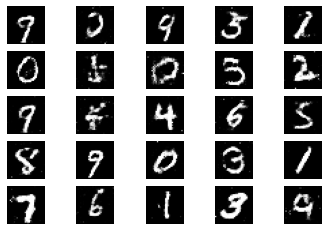

[31/50][120/468]	Loss_D: 1.3065	Loss_G: 0.8839	D(x): 0.5365	D(G(z)): 0.4636 / 0.4177


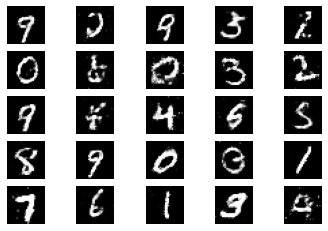

[31/50][240/468]	Loss_D: 1.3066	Loss_G: 0.8612	D(x): 0.5426	D(G(z)): 0.4749 / 0.4277


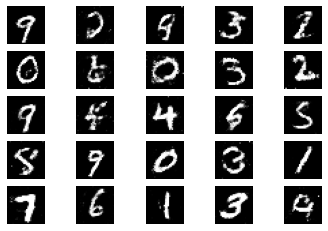

[31/50][360/468]	Loss_D: 1.2693	Loss_G: 0.8997	D(x): 0.5625	D(G(z)): 0.4704 / 0.4141


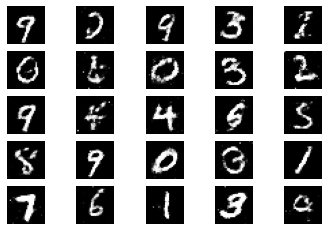

[32/50][0/468]	Loss_D: 1.2852	Loss_G: 0.9212	D(x): 0.5244	D(G(z)): 0.4458 / 0.4078


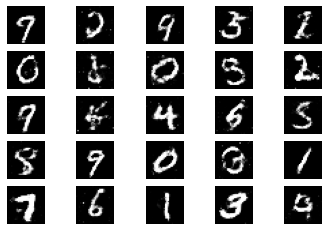

[32/50][120/468]	Loss_D: 1.3561	Loss_G: 0.8717	D(x): 0.5566	D(G(z)): 0.5108 / 0.4244


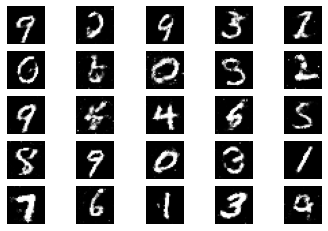

[32/50][240/468]	Loss_D: 1.3364	Loss_G: 0.9034	D(x): 0.5175	D(G(z)): 0.4669 / 0.4113


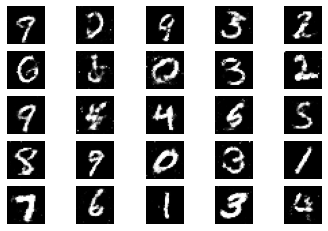

[32/50][360/468]	Loss_D: 1.3662	Loss_G: 0.8669	D(x): 0.5069	D(G(z)): 0.4714 / 0.4238


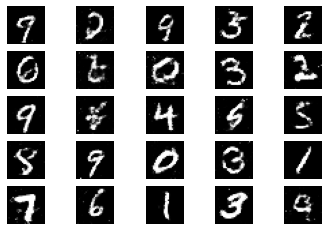

[33/50][0/468]	Loss_D: 1.3269	Loss_G: 0.8607	D(x): 0.5583	D(G(z)): 0.4978 / 0.4288


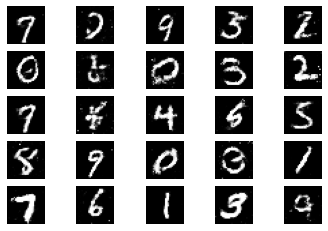

[33/50][120/468]	Loss_D: 1.3526	Loss_G: 0.9440	D(x): 0.5304	D(G(z)): 0.4783 / 0.3962


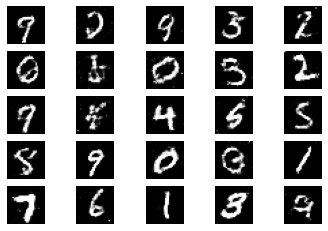

[33/50][240/468]	Loss_D: 1.3134	Loss_G: 0.9059	D(x): 0.5333	D(G(z)): 0.4672 / 0.4108


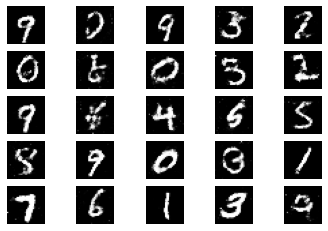

[33/50][360/468]	Loss_D: 1.3452	Loss_G: 0.8819	D(x): 0.5053	D(G(z)): 0.4518 / 0.4192


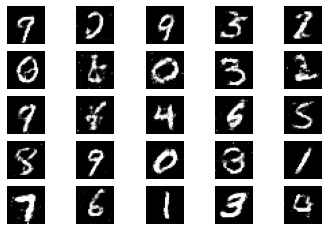

[34/50][0/468]	Loss_D: 1.2697	Loss_G: 0.9147	D(x): 0.5371	D(G(z)): 0.4512 / 0.4057


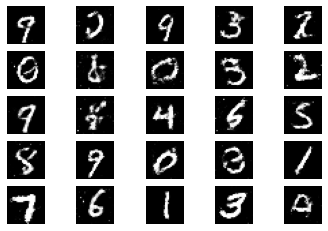

[34/50][120/468]	Loss_D: 1.4159	Loss_G: 0.8236	D(x): 0.4594	D(G(z)): 0.4372 / 0.4427


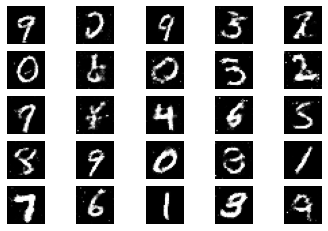

[34/50][240/468]	Loss_D: 1.3062	Loss_G: 0.8701	D(x): 0.5374	D(G(z)): 0.4720 / 0.4238


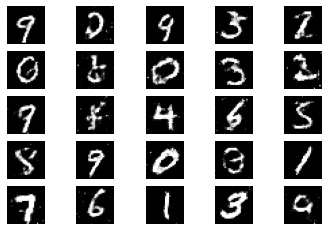

[34/50][360/468]	Loss_D: 1.3723	Loss_G: 0.9028	D(x): 0.5153	D(G(z)): 0.4839 / 0.4101


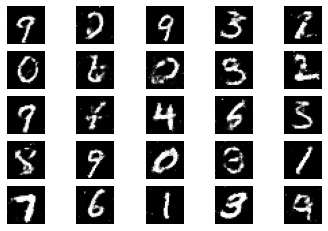

[35/50][0/468]	Loss_D: 1.3546	Loss_G: 0.9350	D(x): 0.5419	D(G(z)): 0.4982 / 0.3979


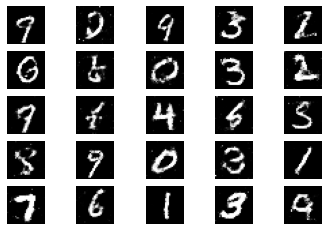

[35/50][120/468]	Loss_D: 1.3494	Loss_G: 0.8683	D(x): 0.5299	D(G(z)): 0.4852 / 0.4278


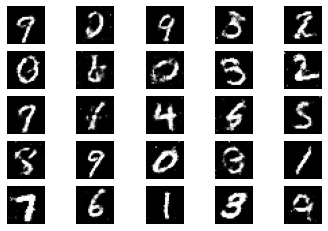

[35/50][240/468]	Loss_D: 1.3265	Loss_G: 0.9399	D(x): 0.5452	D(G(z)): 0.4762 / 0.3996


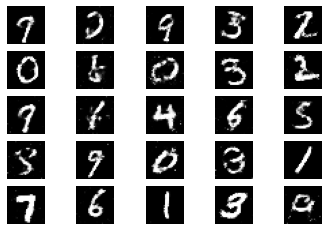

[35/50][360/468]	Loss_D: 1.3576	Loss_G: 0.9419	D(x): 0.5258	D(G(z)): 0.4776 / 0.3972


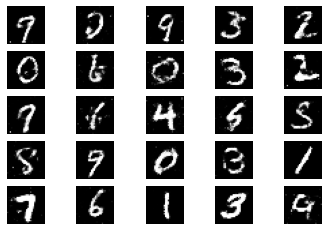

[36/50][0/468]	Loss_D: 1.3834	Loss_G: 0.8145	D(x): 0.4955	D(G(z)): 0.4665 / 0.4465


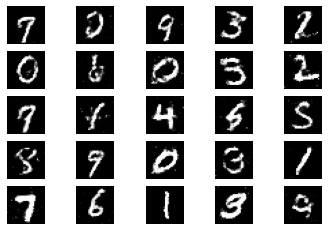

[36/50][120/468]	Loss_D: 1.3261	Loss_G: 0.9587	D(x): 0.5366	D(G(z)): 0.4765 / 0.3880


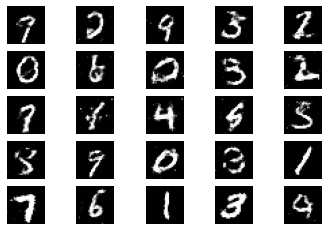

[36/50][240/468]	Loss_D: 1.3512	Loss_G: 0.9279	D(x): 0.5314	D(G(z)): 0.4877 / 0.3993


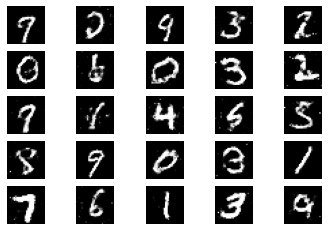

[36/50][360/468]	Loss_D: 1.3513	Loss_G: 0.9300	D(x): 0.5419	D(G(z)): 0.4917 / 0.4017


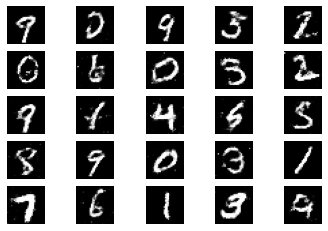

[37/50][0/468]	Loss_D: 1.3359	Loss_G: 0.9014	D(x): 0.5165	D(G(z)): 0.4631 / 0.4134


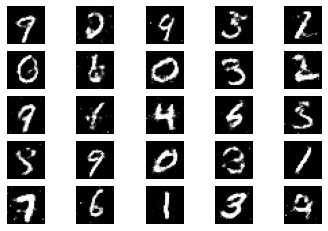

[37/50][120/468]	Loss_D: 1.3862	Loss_G: 0.9195	D(x): 0.5088	D(G(z)): 0.4810 / 0.4029


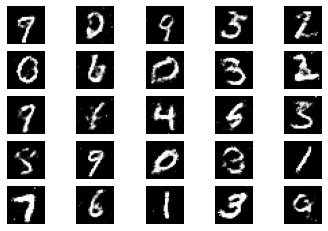

[37/50][240/468]	Loss_D: 1.3273	Loss_G: 0.8539	D(x): 0.5077	D(G(z)): 0.4535 / 0.4303


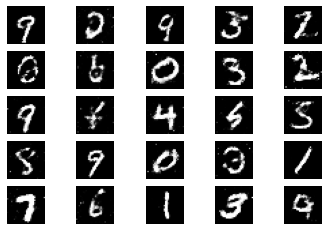

[37/50][360/468]	Loss_D: 1.3350	Loss_G: 0.8220	D(x): 0.5063	D(G(z)): 0.4547 / 0.4436


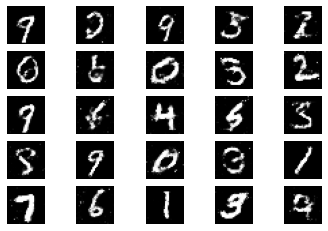

[38/50][0/468]	Loss_D: 1.2978	Loss_G: 0.8853	D(x): 0.5747	D(G(z)): 0.5044 / 0.4172


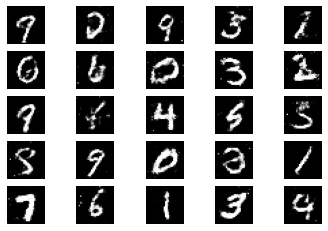

[38/50][120/468]	Loss_D: 1.2968	Loss_G: 0.8391	D(x): 0.5393	D(G(z)): 0.4698 / 0.4377


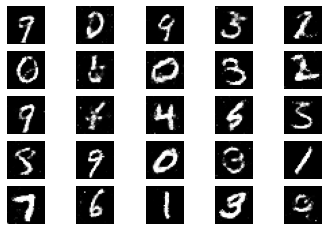

[38/50][240/468]	Loss_D: 1.2659	Loss_G: 0.8934	D(x): 0.5531	D(G(z)): 0.4694 / 0.4164


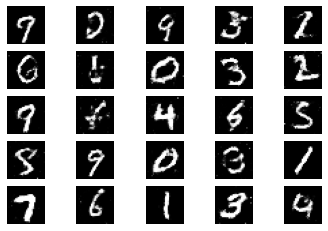

[38/50][360/468]	Loss_D: 1.3199	Loss_G: 0.8956	D(x): 0.5325	D(G(z)): 0.4699 / 0.4161


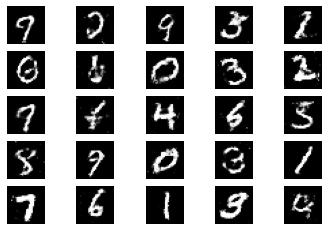

[39/50][0/468]	Loss_D: 1.3260	Loss_G: 0.8740	D(x): 0.5392	D(G(z)): 0.4865 / 0.4230


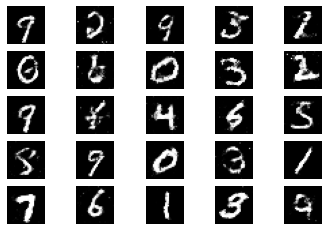

[39/50][120/468]	Loss_D: 1.3020	Loss_G: 0.8566	D(x): 0.5325	D(G(z)): 0.4710 / 0.4290


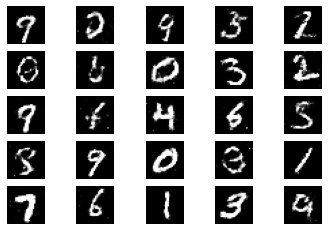

[39/50][240/468]	Loss_D: 1.3205	Loss_G: 0.8734	D(x): 0.5535	D(G(z)): 0.4890 / 0.4247


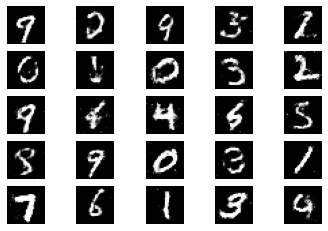

[39/50][360/468]	Loss_D: 1.3575	Loss_G: 0.8846	D(x): 0.5314	D(G(z)): 0.4911 / 0.4182


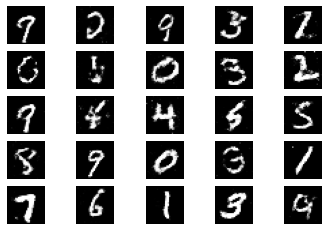

[40/50][0/468]	Loss_D: 1.2854	Loss_G: 0.8867	D(x): 0.5500	D(G(z)): 0.4704 / 0.4159


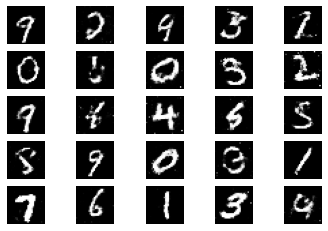

[40/50][120/468]	Loss_D: 1.3296	Loss_G: 0.8239	D(x): 0.5525	D(G(z)): 0.4993 / 0.4443


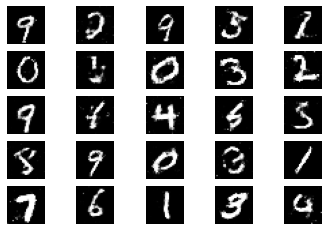

[40/50][240/468]	Loss_D: 1.3044	Loss_G: 0.8878	D(x): 0.5575	D(G(z)): 0.4855 / 0.4158


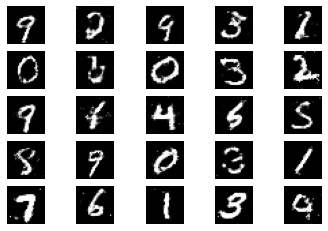

[40/50][360/468]	Loss_D: 1.3225	Loss_G: 0.8420	D(x): 0.5254	D(G(z)): 0.4711 / 0.4361


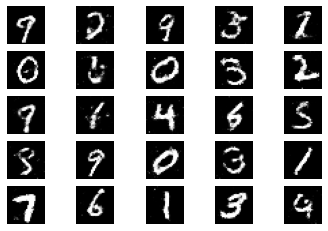

[41/50][0/468]	Loss_D: 1.3570	Loss_G: 0.9218	D(x): 0.5376	D(G(z)): 0.4939 / 0.4047


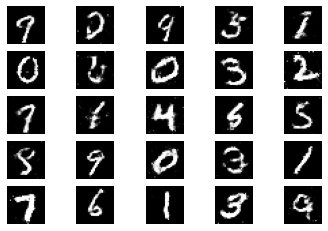

[41/50][120/468]	Loss_D: 1.3854	Loss_G: 0.8336	D(x): 0.5013	D(G(z)): 0.4776 / 0.4374


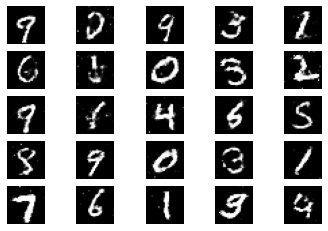

[41/50][240/468]	Loss_D: 1.3178	Loss_G: 0.8666	D(x): 0.5221	D(G(z)): 0.4666 / 0.4259


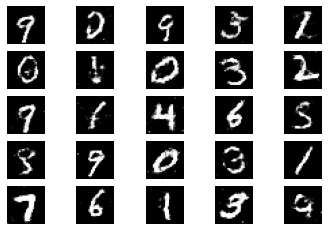

[41/50][360/468]	Loss_D: 1.3691	Loss_G: 0.8494	D(x): 0.5354	D(G(z)): 0.4994 / 0.4324


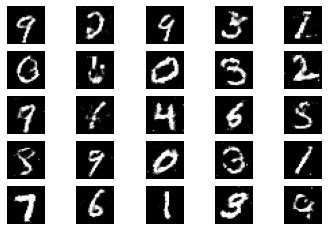

[42/50][0/468]	Loss_D: 1.3142	Loss_G: 0.9223	D(x): 0.5578	D(G(z)): 0.4953 / 0.4031


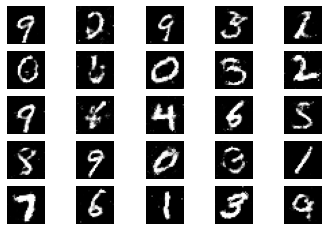

[42/50][120/468]	Loss_D: 1.3280	Loss_G: 0.8793	D(x): 0.5225	D(G(z)): 0.4699 / 0.4203


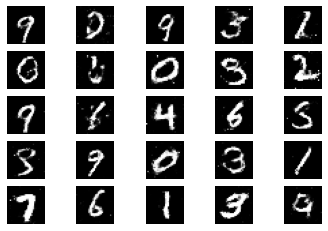

[42/50][240/468]	Loss_D: 1.3654	Loss_G: 0.8849	D(x): 0.5013	D(G(z)): 0.4668 / 0.4159


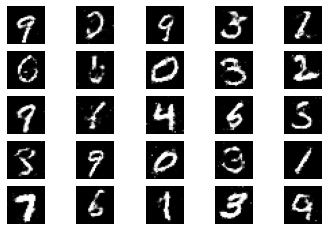

[42/50][360/468]	Loss_D: 1.3462	Loss_G: 0.8264	D(x): 0.5195	D(G(z)): 0.4808 / 0.4415


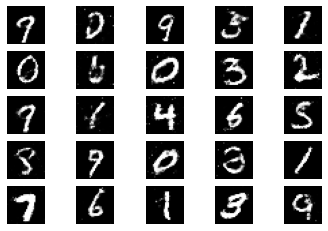

[43/50][0/468]	Loss_D: 1.3453	Loss_G: 0.8663	D(x): 0.5306	D(G(z)): 0.4819 / 0.4252


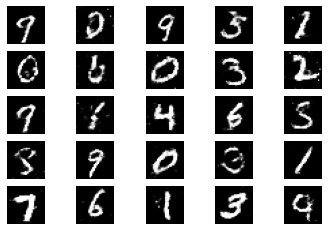

[43/50][120/468]	Loss_D: 1.3457	Loss_G: 0.8662	D(x): 0.5170	D(G(z)): 0.4779 / 0.4237


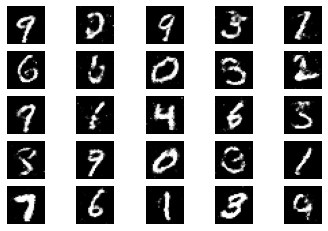

[43/50][240/468]	Loss_D: 1.3197	Loss_G: 0.8590	D(x): 0.5711	D(G(z)): 0.5041 / 0.4282


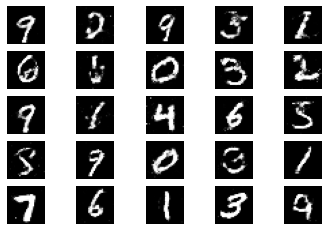

[43/50][360/468]	Loss_D: 1.3491	Loss_G: 0.8721	D(x): 0.5079	D(G(z)): 0.4614 / 0.4229


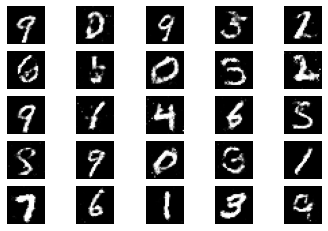

[44/50][0/468]	Loss_D: 1.3014	Loss_G: 0.8601	D(x): 0.5291	D(G(z)): 0.4645 / 0.4273


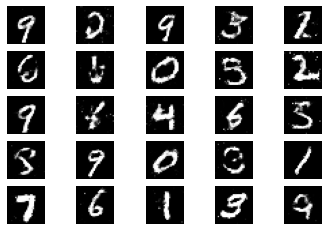

[44/50][120/468]	Loss_D: 1.3553	Loss_G: 0.9307	D(x): 0.5079	D(G(z)): 0.4693 / 0.3989


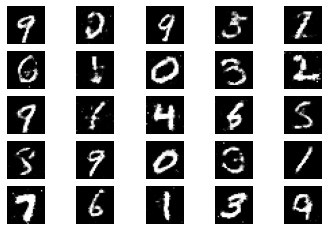

[44/50][240/468]	Loss_D: 1.3510	Loss_G: 0.8620	D(x): 0.5094	D(G(z)): 0.4676 / 0.4283


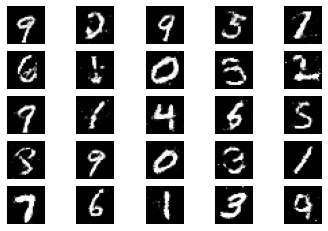

[44/50][360/468]	Loss_D: 1.2900	Loss_G: 0.8708	D(x): 0.5209	D(G(z)): 0.4479 / 0.4224


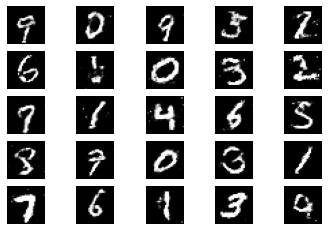

[45/50][0/468]	Loss_D: 1.3054	Loss_G: 0.8398	D(x): 0.5394	D(G(z)): 0.4779 / 0.4352


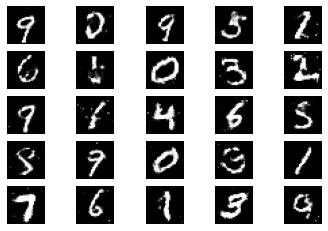

[45/50][120/468]	Loss_D: 1.3380	Loss_G: 0.8977	D(x): 0.5601	D(G(z)): 0.5113 / 0.4120


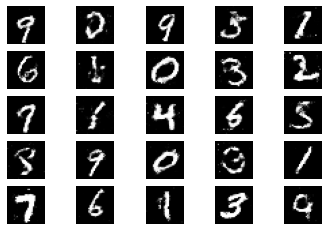

[45/50][240/468]	Loss_D: 1.4007	Loss_G: 0.8892	D(x): 0.4738	D(G(z)): 0.4489 / 0.4154


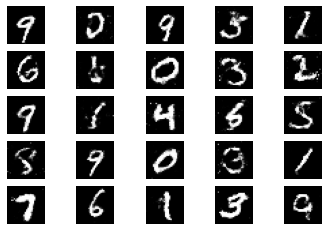

[45/50][360/468]	Loss_D: 1.3647	Loss_G: 0.9188	D(x): 0.5090	D(G(z)): 0.4790 / 0.4041


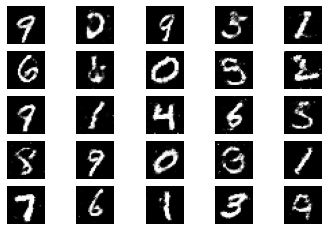

[46/50][0/468]	Loss_D: 1.3209	Loss_G: 0.8357	D(x): 0.5433	D(G(z)): 0.4897 / 0.4380


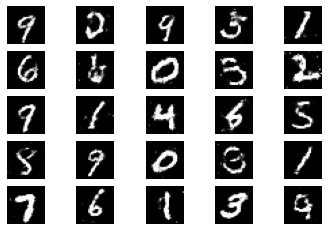

[46/50][120/468]	Loss_D: 1.3654	Loss_G: 0.8596	D(x): 0.5197	D(G(z)): 0.4851 / 0.4286


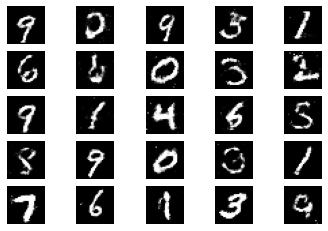

[46/50][240/468]	Loss_D: 1.3155	Loss_G: 0.8829	D(x): 0.5111	D(G(z)): 0.4539 / 0.4179


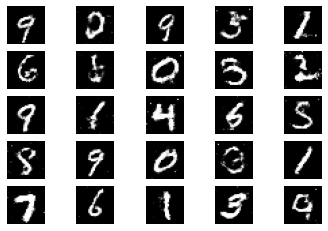

[46/50][360/468]	Loss_D: 1.3276	Loss_G: 0.8313	D(x): 0.5348	D(G(z)): 0.4760 / 0.4405


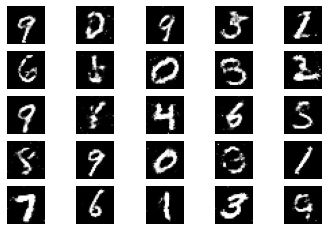

[47/50][0/468]	Loss_D: 1.3305	Loss_G: 0.8435	D(x): 0.5317	D(G(z)): 0.4855 / 0.4356


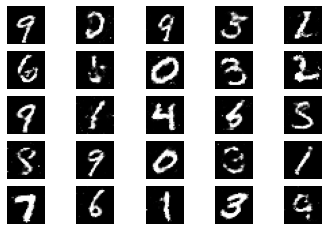

[47/50][120/468]	Loss_D: 1.3640	Loss_G: 0.8607	D(x): 0.4812	D(G(z)): 0.4462 / 0.4265


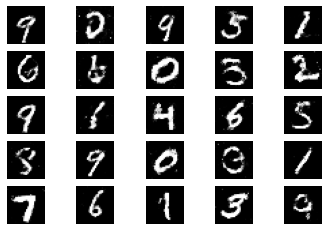

[47/50][240/468]	Loss_D: 1.3468	Loss_G: 0.8492	D(x): 0.5293	D(G(z)): 0.4899 / 0.4329


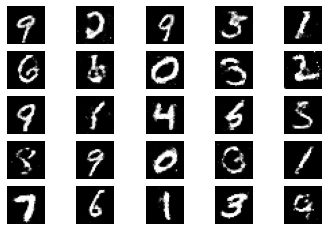

[47/50][360/468]	Loss_D: 1.3306	Loss_G: 0.9254	D(x): 0.5240	D(G(z)): 0.4713 / 0.4027


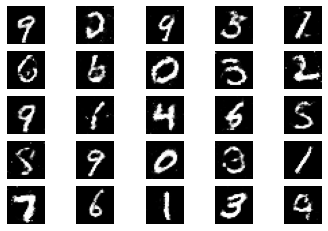

[48/50][0/468]	Loss_D: 1.3659	Loss_G: 0.8788	D(x): 0.5309	D(G(z)): 0.4967 / 0.4206


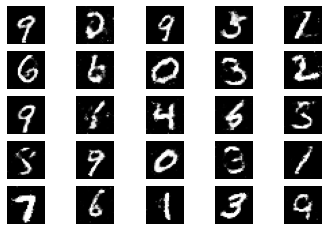

[48/50][120/468]	Loss_D: 1.4431	Loss_G: 0.7910	D(x): 0.5151	D(G(z)): 0.5098 / 0.4562


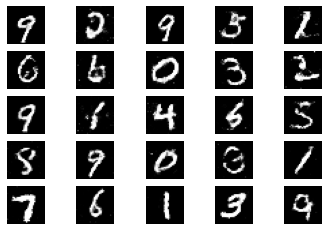

[48/50][240/468]	Loss_D: 1.3498	Loss_G: 0.8488	D(x): 0.5290	D(G(z)): 0.4868 / 0.4327


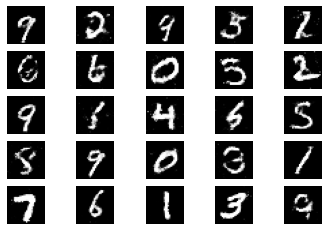

[48/50][360/468]	Loss_D: 1.3193	Loss_G: 0.8939	D(x): 0.5225	D(G(z)): 0.4633 / 0.4135


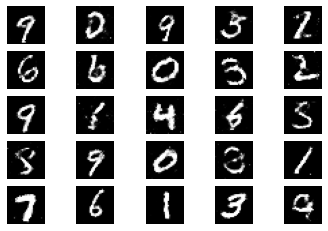

[49/50][0/468]	Loss_D: 1.3703	Loss_G: 0.8593	D(x): 0.4963	D(G(z)): 0.4662 / 0.4288


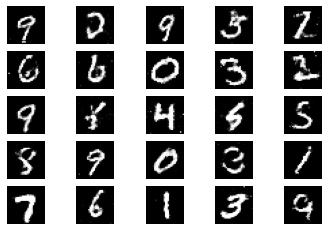

[49/50][120/468]	Loss_D: 1.3737	Loss_G: 0.8319	D(x): 0.5040	D(G(z)): 0.4749 / 0.4394


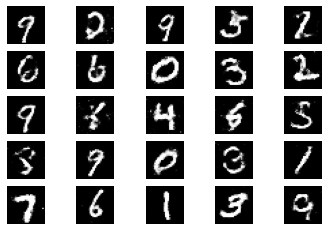

[49/50][240/468]	Loss_D: 1.3474	Loss_G: 0.8629	D(x): 0.5297	D(G(z)): 0.4859 / 0.4261


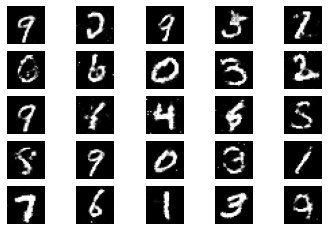

[49/50][360/468]	Loss_D: 1.2965	Loss_G: 0.8286	D(x): 0.5391	D(G(z)): 0.4674 / 0.4417


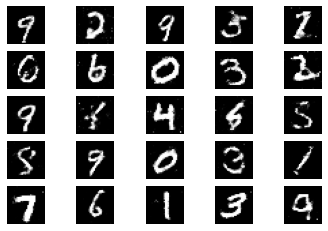

In [18]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    iters = 0
    for x, _ in dataloader:
        x = x.to(device)

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch

        netD.zero_grad()
        # actual batch size in this iteration
        b_size = len(x)
        label = as_tensor(np.full((b_size,), real_label, dtype=np.float32)).to(device)
        # Forward pass real batch through D
        output = netD(x).flatten()
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.data.mean()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = as_tensor(np.random.randn(b_size, nz)).to(device)
        # Generate fake image batch with G
        fake = netG(noise)
        label = as_tensor(np.full((b_size,), fake_label, dtype=np.float32)).to(device)
        # Classify all fake batch with D
        output = netD(fake).flatten()
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.data.mean()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        
        netG.zero_grad()
        # fake labels are real for generator cost
        label = as_tensor(np.full((b_size,), real_label, dtype=np.float32)).to(device)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        with test_mode():
          output = netD(fake).flatten()
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.data.mean()
        # Update G
        optimizerG.step()


        # Output training stats
        if iters % 120 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, iters, len(dataloader.dataset) // batch_size,
                     errD.data, errG.data, D_x, D_G_z1, D_G_z2))
            
            with no_grad():
                fake = netG(fixed_noise)
            img = as_numpy(fake.data.reshape((25, 1, image_size, image_size)))
            plt.figure()
            for j in range(0, 25):
              ax = plt.subplot(5, 5, j+1)
              ax.axis('off')
              plt.imshow(img[j][0], 'gray')
            plt.show()

            img_list.append(img)

        # Save Losses for plotting later
        G_losses.append(errG.data)
        D_losses.append(errD.data)

        iters += 1

In [19]:
np.save('gan_mnist_imgs.npy', np.array(img_list))